# Big Data Project - ImageRecommender
## Color Comparison 
Code and Dokumentation

Solution with KMeans Clustering for Image Colors and Coordinates, Distance between results calculated with Wasserstein Distance / Earth Movers Distance with weighted input

        note: I noticed a difference with different similarity meassures this will be checken in  the end

#### Import Libraries

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sb
import matplotlib.pyplot as plt

#### Some Variables
those could be user input later, or study what works best

Position: <br>
The Idea here is that we give the oportunity to also use the information where a color is to find images with similar colors at the same position

In [2]:
IMG_SIZE = (100,100)
CLUSTERS = 5
MIN_PIX_FOR_CLUSTER= 100
COLOR_WEIGHT = 100
POSITION_WEIGHT  = 0
ALPHA = 0.01

#### Import of Images

In [3]:
def load_images_from_folder(folder):
    """Lädt Bilder aus einem Ordner als BGR (OpenCV-Standard)."""
    images = {}
    for filename in os.listdir(folder):
        if filename.lower().endswith((".jpg", ".jpeg", ".png")):
            path = os.path.join(folder, filename)
            img = cv2.imread(path)  # BGR
            if img is not None:
                images[filename] = img
    return images

#### Methods for Image Preprocessing

In [4]:
def preprocess_image(img, target_size=IMG_SIZE):
    """Ensure imgs are all in same size and colorspace"""
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, target_size)
    return img_resized

#processed_images = {name: preprocess_image(img, target_size) for name, img in raw_images.items()}

#### KMeans Clustering

In [5]:
def kmeans_color_clustering(img, clusters=CLUSTERS, n_init = MIN_PIX_FOR_CLUSTER, spatial=False):
    """
    KMeans Clustering with one Image    
    - spatial=False: Clustering by Colors in image
    - spatial=True: Clustering by Colors in image incl. Positions

    Proposel for enhancement: 
    - check how far away from cluster center is the pixel, 
    - maybe calculate STD within each Cluster and then do sth with that 
    ( clusters with more then x distance are part of no Cluster or if STD is big this Cluster should have less impact)
    """
    h, w = IMG_SIZE
    img_norm = img / 255.0
    pixels = img_norm.reshape(-1, 3)

    if spatial:
        # Creeate Meshgrid to store Position information
        xx, yy = np.meshgrid(np.arange(w), np.arange(h))
        coords = np.stack((yy, xx), axis=-1).reshape(-1, 2) / np.array([h, w])
        features = np.concatenate([pixels, coords], axis=1)  # [R,G,B,Y,X]
    else:
        features = pixels  # [R,G,B]

    kmeans = KMeans(n_clusters=clusters, n_init=n_init)
    kmeans.fit(features)

    centers = kmeans.cluster_centers_
    counts = np.bincount(kmeans.labels_) / len(kmeans.labels_)

    result = np.hstack((centers, counts.reshape(-1, 1)))
    return result


#### Prepare CLuster Result for Comparison

In [6]:

def prepare_cluster_for_comparison(array, color_weight=COLOR_WEIGHT, position_weight=POSITION_WEIGHT):
    feature_dim = array.shape[1] - 1
    if feature_dim == 3:
        scaling = np.array([color_weight] * 3)
    elif feature_dim == 5:
        scaling = np.array([color_weight] * 3 + [position_weight] * 2)
    else:
        raise ValueError(f"Unerwartete Feature-Dimension: {feature_dim}")

    features = array[:, :feature_dim] * scaling
    weights = array[:, -1]
    return np.hstack([weights[:, np.newaxis], features]).astype(np.float32)

#### Wasserstein / Earth Movers Distance


In [7]:
def emd_distance(wheighted_clusters1, wheighted_clusters2):
    min_len = min(len(wheighted_clusters1), len(wheighted_clusters2))
    wc1 = wheighted_clusters1[:min_len]
    wc2 = wheighted_clusters2[:min_len]
    distance, lowerBound , flow  = cv2.EMD(wc1, wc2, cv2.DIST_L2)
    return distance

In [8]:
# # # For scaling between 0 and 1 - ChatGPT Proposal
def emd_similarity_score(distance, alpha=1.0):
    return np.exp(-alpha * distance)

# # EMD kann beliebig große Werte annehmen → kein natürliches Maximum
# # Aber: exp(-distance) ergibt immer einen Wert zwischen 0 und 1, wobei:
# # 1.0 = identisch
# # ~0.0 = sehr unähnlich
# # Der Parameter alpha steuert, wie steil der Abfall ist (z.B. alpha=0.05 für langsameren Abfall)

# Additional Visualisation methods (By ChatGPT)

just to show a little bit better what happens 

In [9]:
from sklearn.decomposition import PCA


def plot_clusters_in_2d(img, kmeans, sample_size=1000):
    """Zeigt die Farbverteilung und Clusterzentren in 2D (PCA auf RGB)"""
    
    X = img.reshape(-1, 3)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_

    # Falls das Bild zu groß ist, Stichprobe nehmen
    if len(X) > sample_size:
        idx = np.random.choice(len(X), sample_size, replace=False)
        X_sample = X[idx]
        labels_sample = labels[idx]
    else:
        X_sample = X
        labels_sample = labels

    # PCA zur Projektion in 2D
    pca = PCA(n_components=2)
    X_2d = pca.fit_transform(X_sample)
    centers_2d = pca.transform(centers)

    # Punkte plotten, eingefärbt nach RGB (original)
    plt.figure(figsize=(6, 6))
    plt.scatter(X_2d[:, 0], X_2d[:, 1], c=X_sample / 255, s=10, alpha=0.6, label="Pixels")

    # Clusterzentren plotten
    plt.scatter(centers_2d[:, 0], centers_2d[:, 1], 
                c=centers / 255, edgecolor='black', 
                s=300, marker='X', label="Cluster Centers")

    plt.title("Farben im RGB-Raum (PCA auf 2D)")
    plt.axis("off")
    plt.legend()
    plt.show()


def visualize_kmeans(img, kmeans):
    """Visualisiert die Clusterfarben nach Häufigkeit und zeigt das segmentierte Bild."""
    h, w, _ = img.shape
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_

    # Clusterhäufigkeit ermitteln
    _, counts = np.unique(labels, return_counts=True)
    proportions = counts / counts.sum()

    # Balken-Visualisierung der Farben (nach Häufigkeit sortiert)
    sorted_idx = np.argsort(-proportions)
    sorted_colors = centers[sorted_idx]
    sorted_proportions = proportions[sorted_idx]

    # Erzeuge Farbbalken
    bar = np.zeros((50, 300, 3), dtype='uint8')
    start_x = 0
    for prop, color in zip(sorted_proportions, sorted_colors):
        end_x = start_x + int(prop * bar.shape[1])
        cv2.rectangle(bar, (start_x, 0), (end_x, bar.shape[0]), color.astype('uint8').tolist(), -1)
        start_x = end_x

    # Zeige die Farbbalken
    plt.figure(figsize=(10, 2))
    plt.imshow(bar)
    plt.axis('off')
    plt.title("Dominante Farben (nach Anteil)")
    plt.show()

    # Segmentiertes Bild anzeigen
    segmented_img = centers[labels].reshape((h, w, 3)).astype(np.uint8)
    plt.figure(figsize=(3, 3))
    plt.imshow(segmented_img)
    plt.axis('off')
    plt.title("Segmentiertes Bild")
    plt.show()

def show_similarity_heatmap(df_similarity):
    df_plot = df_similarity.set_index("Compared_with")
    plt.figure(figsize=(10, 8))
    sb.heatmap(df_plot, annot=False, cmap="YlGn")
    plt.title("Image Similarity Heatmap")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


# Main with 2 Images incl. Visualisation

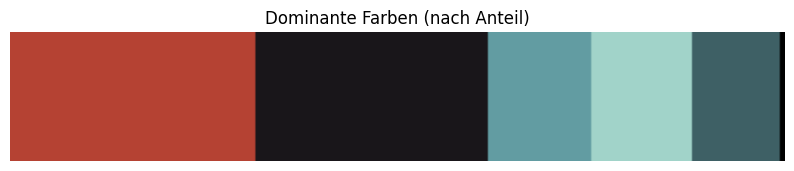

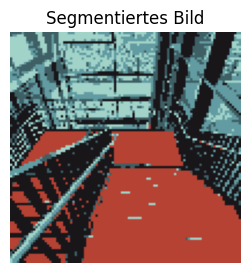

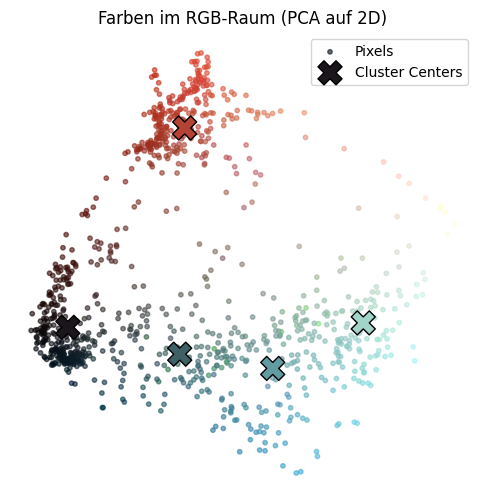

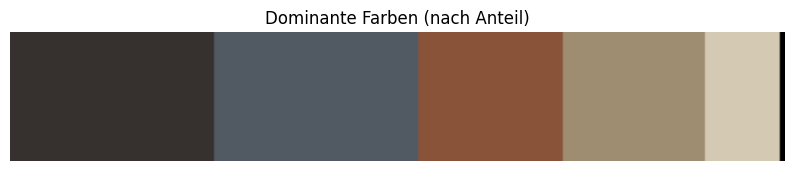

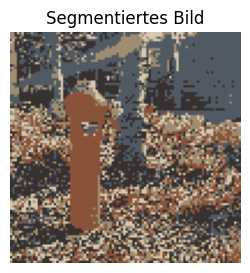

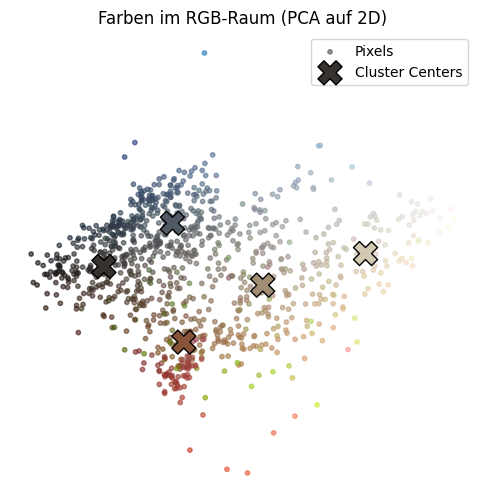

EMD Distance between '20250328_101537.jpg' and '20250328_101653.jpg': 32.1060
Similarity Score (exp(-dist)): 0.7254


In [10]:

folder = "images_"#os.path.join(os.getcwd(), "..", "expImg")
images = load_images_from_folder(folder)
processed_images = {name: preprocess_image(img, IMG_SIZE) for name, img in images.items()}

image_names = list(processed_images.keys())
img1 = processed_images[image_names[0]]
img2 = processed_images[image_names[2]]

# Clustering
res1 = kmeans_color_clustering(img1, CLUSTERS, MIN_PIX_FOR_CLUSTER, spatial=True)
res2 = kmeans_color_clustering(img2, CLUSTERS, MIN_PIX_FOR_CLUSTER, spatial=True)

# Vis
kmeans1 = KMeans(n_clusters=CLUSTERS, n_init=MIN_PIX_FOR_CLUSTER)
kmeans1.fit(img1.reshape(-1, 3))
visualize_kmeans(img1, kmeans1)
plot_clusters_in_2d(img1, kmeans1)

kmeans2 = KMeans(n_clusters=CLUSTERS, n_init=MIN_PIX_FOR_CLUSTER)
kmeans2.fit(img2.reshape(-1, 3))
visualize_kmeans(img2, kmeans2)
plot_clusters_in_2d(img2, kmeans2)

# prepare for comparison
wc1 = prepare_cluster_for_comparison(res1)
wc2 = prepare_cluster_for_comparison(res2)

# calculate EMD 
dist = emd_distance(wc1, wc2)
sim = emd_similarity_score(dist, alpha=ALPHA)

print(f"EMD Distance between '{image_names[0]}' and '{image_names[1]}': {dist:.4f}")
print(f"Similarity Score (exp(-dist)): {sim:.4f}")


# Main With All Images in Folder + Heatmap

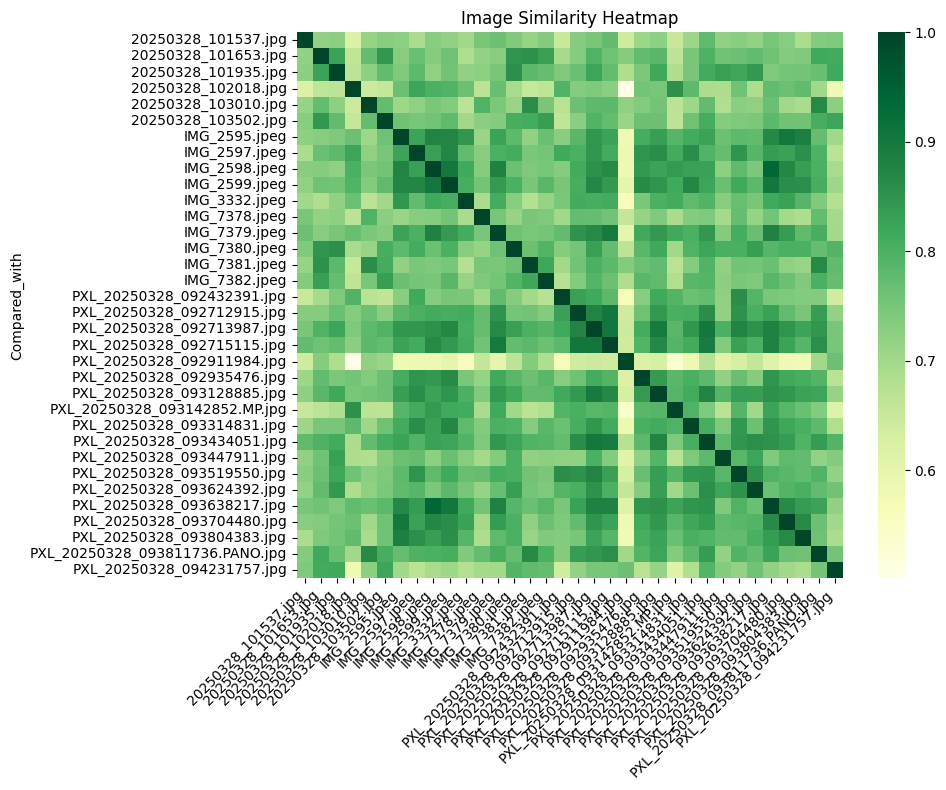

In [11]:
# Prepare images + Clustering
clustered_data = {}
for name, img in processed_images.items():
    res = kmeans_color_clustering(img, CLUSTERS, MIN_PIX_FOR_CLUSTER, spatial=True)
    clustered_data[name] = prepare_cluster_for_comparison(res)

# Calculate Similarity score for each pair
similarity_matrix = pd.DataFrame(index=clustered_data.keys(), columns=clustered_data.keys(), dtype=float)

for name1, wc1 in clustered_data.items():
    for name2, wc2 in clustered_data.items():
        dist = emd_distance(wc1, wc2)
        similarity_matrix.loc[name1, name2] = emd_similarity_score(dist, alpha=ALPHA)  # optional: similarity statt distance

# Create Heatmap
similarity_matrix.insert(0, "Compared_with", similarity_matrix.index)
show_similarity_heatmap(similarity_matrix)


# All code for 1 or more input images

In [1]:
# libraries
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [18]:
# Config later in init or user input

IMG_SIZE = (100, 100)
CLUSTERS = 5
MIN_PIX_FOR_CLUSTER = 100
COLOR_WEIGHT = 0
POSITION_WEIGHT = 1
ALPHA = 0.5

In [3]:
# Load and preprocess/prepare
def load_images_from_folder(folder, target_size=(100, 100)):
    """Load and resize images to avoid memory issues."""
    images = {}
    for filename in os.listdir(folder):
        if filename.lower().endswith((".jpg", ".jpeg", ".png")):
            path = os.path.join(folder, filename)
            img = cv2.imread(path)
            if img is not None:
                img = cv2.resize(img, target_size)  # resize immediately
                images[filename] = img
    return images



def preprocess_image(img, target_size=IMG_SIZE):
    """Resize image and convert to RGB."""
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, target_size)
    return img_resized

k means Clustering

there are needed adjustemtns because number of clusters, + position is actually something we have to decide while creating the data base, maybe we should not use the position

In [ ]:
def kmeans_color_clustering(img, clusters=CLUSTERS, n_init=MIN_PIX_FOR_CLUSTER, spatial=False):
    """Perform KMeans clustering on image with optional spatial info."""
    h, w = IMG_SIZE
    pixels = (img / 255.0).reshape(-1, 3)

    if spatial:
        yy, xx = np.meshgrid(np.arange(h), np.arange(w))
        coords = np.stack((yy, xx), axis=-1).reshape(-1, 2) / np.array([h, w])
        features = np.concatenate([pixels, coords], axis=1)  # [R,G,B,Y,X]
    else:
        features = pixels  # [R,G,B]

    kmeans = KMeans(n_clusters=clusters, n_init=n_init)
    kmeans.fit(features)

    centers = kmeans.cluster_centers_
    counts = np.bincount(kmeans.labels_) / len(kmeans.labels_)
    result = np.hstack((centers, counts.reshape(-1, 1)))
    return result

def prepare_cluster_for_comparison(array, color_weight=COLOR_WEIGHT, position_weight=POSITION_WEIGHT):
    """Scale clusters for comparison: weights + color + (optional) position."""
    feature_dim = array.shape[1] - 1
    if feature_dim == 3:
        scaling = np.array([color_weight] * 3)
    elif feature_dim == 5:
        scaling = np.array([color_weight] * 3 + [position_weight] * 2)
    else:
        raise ValueError(f"Unexpected feature dimension: {feature_dim}")
    features = array[:, :feature_dim] * scaling
    weights = array[:, -1]
    return np.hstack([weights[:, np.newaxis], features]).astype(np.float32)


Similarity meassure, should be extended later..

In [5]:
def emd_distance(wc1, wc2):
    """Compute EMD distance between two weighted clusters."""
    min_len = min(len(wc1), len(wc2))
    wc1, wc2 = wc1[:min_len], wc2[:min_len]
    distance, _, _ = cv2.EMD(wc1, wc2, cv2.DIST_L2)
    return distance

def emd_similarity_score(distance, alpha=ALPHA):
    """Convert distance to similarity score [0,1]."""
    return np.exp(-alpha * distance)

pipeline

In [6]:
def build_cluster_dataframe(image_folder):
    """Process all images in folder and return DataFrame with weighted clusters."""
    images = load_images_from_folder(image_folder)
    processed_images = {name: preprocess_image(img) for name, img in images.items()}
    cluster_data = {}
    for name, img in processed_images.items():
        res = kmeans_color_clustering(img, CLUSTERS, MIN_PIX_FOR_CLUSTER, spatial=False)
        cluster_data[name] = prepare_cluster_for_comparison(res)
    df = pd.DataFrame({
        "filename": list(cluster_data.keys()),
        "cluster": list(cluster_data.values())
    })
    return df, processed_images


def pipeline_clusters(query_paths, method="mean"):
    cluster_list = []
    for path in query_paths:
        img = preprocess_image(cv2.imread(path))
        res = kmeans_color_clustering(img, CLUSTERS, MIN_PIX_FOR_CLUSTER, spatial=False)
        cluster_list.append(prepare_cluster_for_comparison(res))
    if len(cluster_list) > 1:
        if method == "mean":
            combined = np.mean(np.array(cluster_list), axis=0)
        elif method == "max":
            combined = np.max(np.array(cluster_list), axis=0)
        else:
            raise ValueError("Method must be 'mean' or 'max'")
        return combined
    return cluster_list[0]

def get_top_n_similar(query_cluster, df_clusters, n=5):
    similarities = []
    for idx, row in df_clusters.iterrows():
        dist = emd_distance(query_cluster, row['cluster'])
        sim = emd_similarity_score(dist)
        similarities.append(sim)
    df_clusters = df_clusters.copy()
    df_clusters['similarity'] = similarities
    df_sorted = df_clusters.sort_values("similarity", ascending=False).head(n)
    return df_sorted, df_sorted['similarity'].values

In [7]:
def plot_queries_and_results(query_paths, top_df, processed_images):
    num_queries = len(query_paths)
    num_results = len(top_df)
    plt.figure(figsize=(4*(num_queries+num_results), 4*2))

    # First row: query images
    for i, path in enumerate(query_paths, start=1):
        img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        plt.subplot(2, max(num_queries, num_results), i)
        plt.imshow(img)
        plt.title(f"Query {i}")
        plt.axis('off')

    # Second row: top results
    for i, fname in enumerate(top_df['filename'], start=1):
        img = processed_images[fname]
        plt.subplot(2, max(num_queries, num_results), max(num_queries, num_results)+i)
        plt.imshow(img)
        plt.title(f"Sim: {top_df['similarity'].iloc[i-1]:.2f}")
        plt.axis('off')
    plt.show()

In [8]:
image_folder = "images_"  # Ordner mit allen Vergleichsbildern
df_clusters, processed_images = build_cluster_dataframe(image_folder)

MAIN

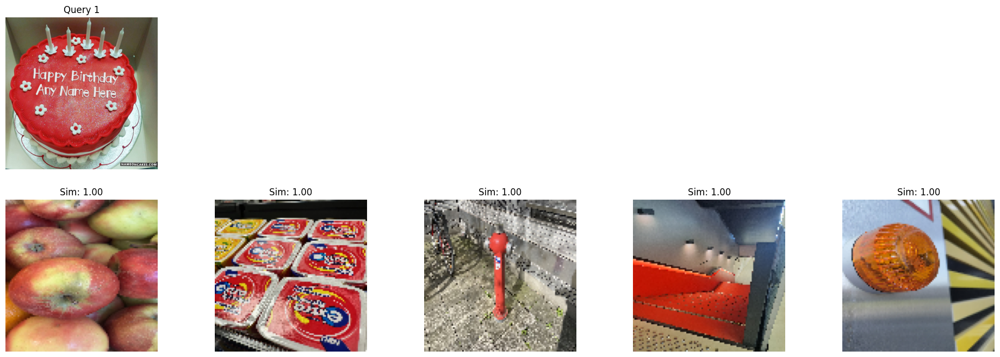

In [9]:
query_paths = ["test6.jpg"]
query_cluster = pipeline_clusters(query_paths, method="mean")

top5_df, similarities = get_top_n_similar(query_cluster, df_clusters, n=5)
plot_queries_and_results(query_paths, top5_df, processed_images)


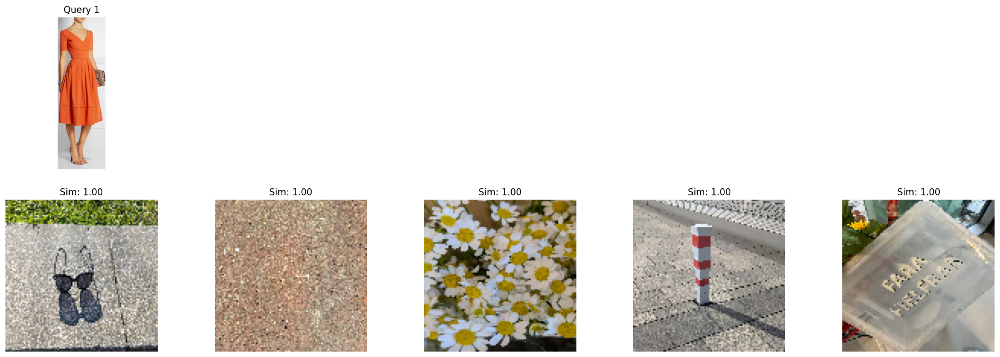

In [10]:

query_paths = ["test5.jpg"]
query_cluster = pipeline_clusters(query_paths, method="mean")

top5_df, similarities = get_top_n_similar(query_cluster, df_clusters, n=5)
plot_queries_and_results(query_paths, top5_df, processed_images)


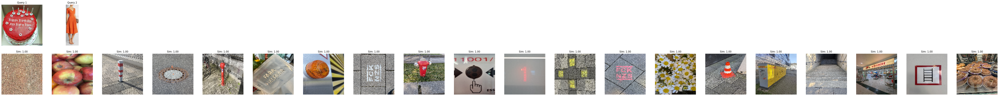

In [20]:
query_paths = [ "test6.jpg", "test5.jpg"]  # example input
query_cluster = pipeline_clusters(query_paths, method="mean")
top5_df, similarities = get_top_n_similar(query_cluster, df_clusters, n=20)
plot_queries_and_results(query_paths, top5_df, processed_images)

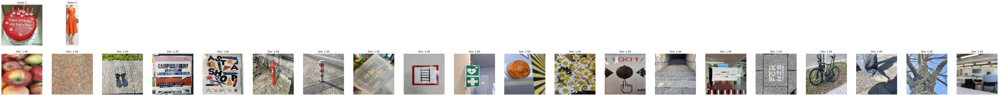

In [19]:
query_paths = [ "test6.jpg", "test5.jpg"]  # example input
query_cluster = pipeline_clusters(query_paths, method="max")

top5_df, similarities = get_top_n_similar(query_cluster, df_clusters, n=20)
plot_queries_and_results(query_paths, top5_df, processed_images)

after testing the spatial feature, i don't feel like it works really well, there are way less images with the same color so I would prefer to not use this
this will also have a possitive effekt on the amount of memory we need.

another problem seems to be the similarity meassure...
there is a problem by normalizing it that the result is not just between 0 and 1 but also a real difference between each of the results, rn everything is just 0
the idea now would be to compare with manhattan and cosine since I already realized in another notebook (comparison of similarity metrics) that those work well with color similarity

# implementation of similarity meassures AND removal of spatial feature..

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.spatial.distance import cosine, cityblock

config now without weights or position info

In [2]:
IMG_SIZE = (100, 100)
CLUSTERS = 8
MIN_PIX_FOR_CLUSTER = 50
DIST_METHOD = "cosine"  # "cosine" oder "manhattan"


preprocess image

In [ ]:
def load_images_from_folder(folder, as_rgb=False):
    """Lädt alle Bilder aus Ordner als BGR."""
    images = {}
    for filename in os.listdir(folder):
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                path = os.path.join(folder, filename)
                img = cv2.imread(path)  # BGR
                if img is not None:
                    if as_rgb:
                        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    images[filename] = img
    return images

def preprocess_image(img, target_size=IMG_SIZE):
    """RGB und auf feste Größe bringen."""
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, target_size)
    return img_resized

adjusted cluster code

In [ ]:
def kmeans_color_clustering(img, clusters=CLUSTERS, top_k=None):
    """KMeans jetzt nur noch auf Farben (RGB normalisiert). Falls top_k gesetzt -> nur größte Cluster."""
    img_norm = img / 255.0
    pixels = img_norm.reshape(-1, 3)

    kmeans = KMeans(
        n_clusters=clusters,
        n_init=10,
        random_state=42
    ).fit(pixels)

    centers = kmeans.cluster_centers_
    counts = np.bincount(kmeans.labels_)

    # Filter kleine Cluster raus
    mask = counts >= MIN_PIX_FOR_CLUSTER
    centers = centers[mask]
    counts = counts[mask]

    # Falls nur Top-K gewünscht
    if top_k is not None and len(counts) > top_k:
        top_idx = np.argsort(counts)[::-1][:top_k]
        centers = centers[top_idx]
        counts = counts[top_idx]

    # Gewichteter Mittelwert der Clusterfarben
    weighted_centers = (centers * counts[:, None]).sum(axis=0) / counts.sum()

    return weighted_centers

distance but has to be adjusted to similarity meassure later, see similarity metrics

In [5]:
def color_distance(vec1, vec2, method=DIST_METHOD):
    if method == "cosine":
        return cosine(vec1, vec2)
    elif method == "manhattan":
        return cityblock(vec1, vec2)
    else:
        raise ValueError("Methode muss 'cosine' oder 'manhattan' sein")


In [6]:
def build_feature_db(folder):
    images = load_images_from_folder(folder, as_rgb=True)

    features = {name: kmeans_color_clustering(preprocess_image(img)) for name, img in images.items()}
    return features, images

def find_similar_images(query_vec, features, top_n=5):
    distances = [(name, color_distance(query_vec, vec)) for name, vec in features.items()]
    distances.sort(key=lambda x: x[1])  # kleiner = ähnlicher ACHTUNG später muss hier descending sortiert werden
    return distances[:top_n]

plot should be generalized for each comparison

In [ ]:
def plot_results(input_imgs, results, db_images):
    """
    input_imgs: Liste von RGB-Bildern (z. B. aus load_images_from_folder(as_rgb=True))
    results: Liste mit (filename, score) der ähnlichsten Bilder
    db_images: Dict {filename: RGB-Bild} für die DB
    """

    fig, axes = plt.subplots(1, len(input_imgs), figsize=(4*len(input_imgs), 4))
    if len(input_imgs) == 1:
        axes = [axes]
    for idx, img in enumerate(input_imgs):
        axes[idx].imshow(img)
        axes[idx].set_title(f"Input {idx+1}")
        axes[idx].axis("off")
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, len(results), figsize=(4*len(results), 4))
    for idx, (name, score) in enumerate(results):
        axes[idx].imshow(db_images[name])  # schon RGB
        axes[idx].set_title(f"{name}\nScore: {score:.3f}")
        axes[idx].axis("off")
    plt.tight_layout()
    plt.show()


Try out

In [8]:
db_features, db_images = build_feature_db("images_")

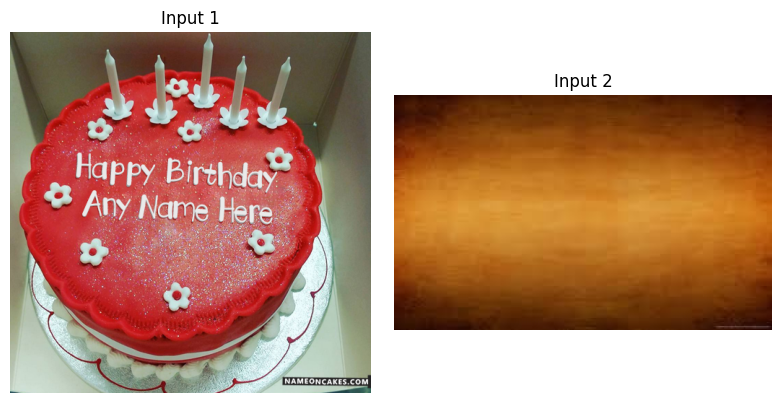

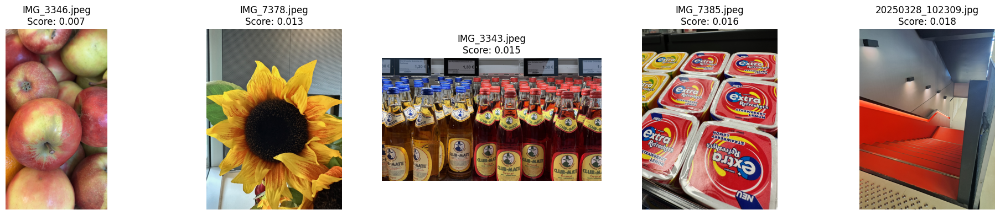

In [12]:

input_images = load_images_from_folder("input_", as_rgb=True)

# Berechne Cluster für alle Inputs und fasse zusammen
all_clusters = []
for img in input_images.values():
    prep = preprocess_image(img)
    vec = kmeans_color_clustering(prep, clusters=CLUSTERS, top_k=5)
    all_clusters.append(vec)

# Durchschnittsvektor über alle Inputs
query_vec = np.mean(all_clusters, axis=0)

# Finde 5 ähnlichste Bilder
results = find_similar_images(query_vec, db_features, top_n=5)

# Plot Input-Bilder + Resultate
plot_results(list(input_images.values()), results, db_images)